In [1]:
from ucimlrepo import fetch_ucirepo 
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
alt.data_transformers.enable("vegafusion")

DataTransformerRegistry.enable('vegafusion')

In [2]:
adult = fetch_ucirepo(id=2)  
X = adult.data.features 
y = adult.data.targets 
  
# metadata 
#print(adult.metadata) 
  
# variable information 
#print(adult.variables) 
X

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States
48838,64,NaN,321403,HS-grad,9,Widowed,NaN,Other-relative,Black,Male,0,0,40,United-States
48839,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States
48840,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States


In [3]:
whole_df = pd.concat([X,y],axis=1)
#whole_df = whole_df.replace("?", np.nan)
#whole_df_cleaned = whole_df.dropna()

In [4]:
train_df, test_df = train_test_split(whole_df, random_state=123, test_size=0.6)
train_df = train_df.replace("?", np.nan)
test_df = test_df.replace("?", np.nan)

In [5]:
train_df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
4044,19,Private,246652,Some-college,10,Never-married,Sales,Own-child,White,Female,0,0,40,United-States,<=50K
34649,20,NaN,323309,HS-grad,9,Never-married,NaN,Own-child,Other,Male,0,0,60,South,<=50K.
48375,51,Self-emp-inc,318351,HS-grad,9,Divorced,Adm-clerical,Not-in-family,White,Female,0,1741,40,United-States,<=50K.
37576,18,Self-emp-not-inc,161245,12th,8,Never-married,Farming-fishing,Own-child,White,Male,0,0,50,United-States,<=50K.
8211,73,Private,301210,1st-4th,2,Married-civ-spouse,Transport-moving,Husband,White,Male,0,1735,20,United-States,<=50K


In [6]:
summary = pd.DataFrame({
    "unique value count": train_df.nunique(),
    "null count": train_df.isnull().sum()
}).T
summary

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
unique value count,72,8,14821,16,16,7,14,6,5,2,113,89,90,40,4
null count,0,1151,0,0,0,0,1153,0,0,0,0,0,0,346,0


In [7]:
train_df["income"].unique()

array(['<=50K', '<=50K.', '>50K', '>50K.'], dtype=object)

We notice that the target variable income contains inconsistent spellings(e.g., '<50K' vs '<50K.'), so we will clean these values before moving on.

In [8]:
train_df["income"] = train_df["income"].str.replace('.', '')

In [9]:
train_df.describe(include="number").round(2)

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,19536.00,19536.00,19536.00,19536.00,19536.00,19536.00
mean,38.67,190134.46,10.08,1067.70,91.99,40.38
std,13.78,106274.65,2.59,7461.83,413.19,12.38
min,17.00,13769.00,1.00,0.00,0.00,1.00
25%,28.00,117496.00,9.00,0.00,0.00,40.00
50%,37.00,178312.00,10.00,0.00,0.00,40.00
75%,48.00,238589.25,12.25,0.00,0.00,45.00
max,90.00,1490400.00,16.00,99999.00,4356.00,99.00


According to the summary table, the numeric features vary widely in both range and scale. For example, hours-per-week ranges from 1 to 99, whereas capital-gain ranges from 0 to 99,999. This large difference in magnitude makes it necessary to apply a StandardScaler to normalize the features so that models relying on distance can compare them fairly.

Additionally, some variables such as capital-gain and capital-loss are extremely skewed, with most values concentrated near zero. We are going to the compare the distribution of the numeric features differ between the two target classes income <=50K and >50K.

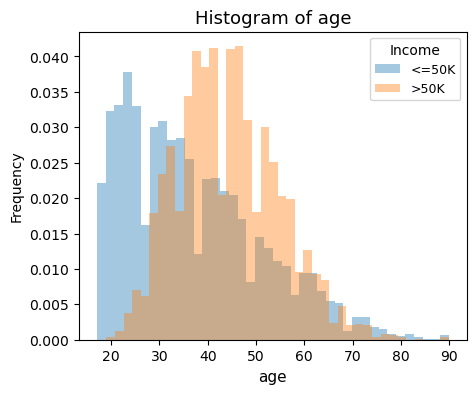

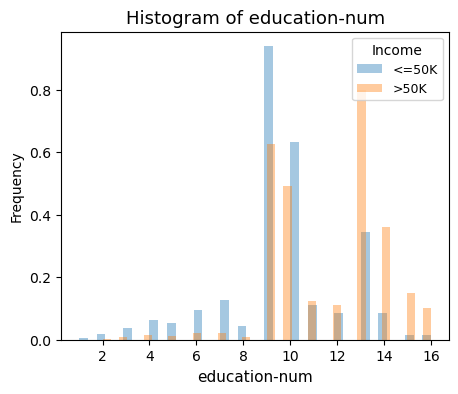

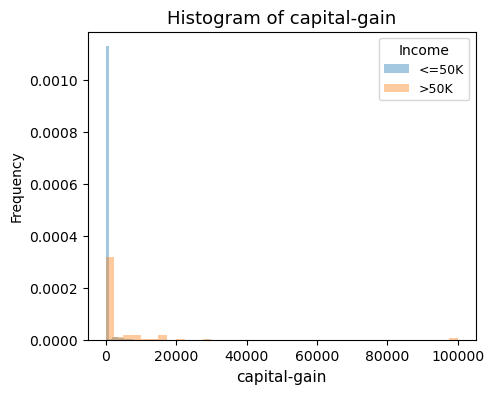

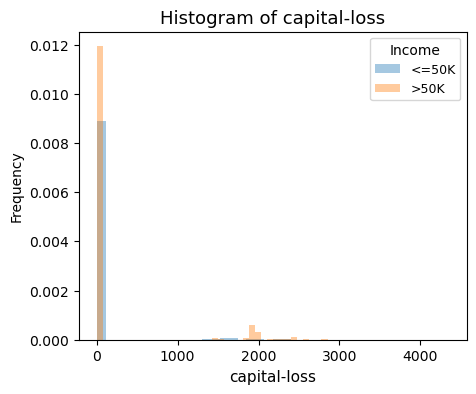

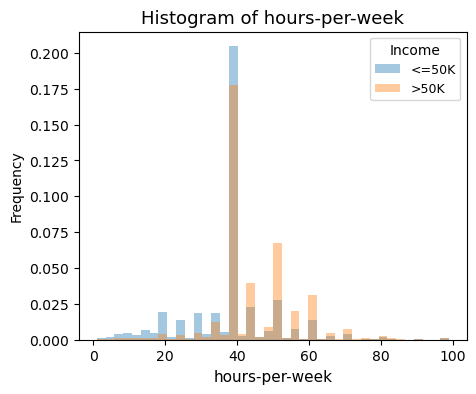

In [10]:
numeric_col_list = ['age',
 'education-num',
 'capital-gain',
 'capital-loss',
 'hours-per-week']

for feat in numeric_col_list:
    plt.figure(figsize=(5, 4))
    train_df.groupby("income")[feat].plot.hist(bins=40, alpha=0.4, legend=True, density=True)
    plt.xlabel(feat, fontsize=11)
    plt.title(f"Histogram of {feat}", fontsize=13)
    plt.legend(title="Income", fontsize=9, title_fontsize=10, loc="upper right")


    plt.show()

### Insights for Histogram of Numeric Features:

- Age: The two income groups differ clearly in their age distributions. Individuals earning >50K tend to be older, most commonly between ages 40 and 55, while the <=50K group is more spread out and skewed younger. This suggests that higher income may be linked to greater work experience.
  
- Education-num: Individuals earning >50K generally have higher education levels, indicating that formal education is an important factor associated with income.

- Capital-gain: The distribution is strongly right-skewed, with most values at zero for both groups. Non-zero values appear more often in the >50K group, and there is an extreme outlier near 100,000.

- Capital-loss: The pattern is similar to capital-gain, with almost all values at zero and slightly more non-zero observations in the >50K group.

- Hours-per-week: Individuals earning >50K tend to work longer hours, showing a clear shift toward extended working time.

In [11]:
corr_df = train_df.corr(method='spearman', numeric_only=True).stack().reset_index()
corr_df.columns = ['Feature 1', 'Feature 2', 'Correlation']
corr_df['Absolute Correlation'] = corr_df['Correlation'].abs()

alt.Chart(corr_df).mark_circle().encode(
    x=alt.X('Feature 1:N', title='Feature 1',axis=alt.Axis(labelAngle=-45)),
    y=alt.Y('Feature 2:N', title='Feature 2'),
    size=alt.Size('Absolute Correlation:Q').scale(domain=(0, 1)),
    color=alt.Color('Correlation:Q').scale(
        scheme='blueorange',
        domain=(-1, 1)
    ),
    tooltip=[
        alt.Tooltip('Feature 1'),
        alt.Tooltip('Feature 2'),
        alt.Tooltip('Correlation', format='.3f', title='Spearman Correlation'),
        alt.Tooltip('Absolute Correlation', format='.3f', title='Absolute Correlation')
    ]
).properties(
    width=380,
    height=380,
    title='Spearman Correlation Bubble Chart for Numeric Features'
).configure_axis(
    labelFontSize=14, 
    titleFontSize=16  
)

alt.Chart(...)

In the Spearman Correlation Bubble Chart for numeric features, we can see that none of the numeric variables are strongly correlated with each other. The highest correlation is between education level and hours per week, at approximately 0.14, which is still very weak. Therefore, multicollinearity is not a concern for these features.

In [12]:
train_df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
4044,19,Private,246652,Some-college,10,Never-married,Sales,Own-child,White,Female,0,0,40,United-States,<=50K
34649,20,NaN,323309,HS-grad,9,Never-married,NaN,Own-child,Other,Male,0,0,60,South,<=50K
48375,51,Self-emp-inc,318351,HS-grad,9,Divorced,Adm-clerical,Not-in-family,White,Female,0,1741,40,United-States,<=50K
37576,18,Self-emp-not-inc,161245,12th,8,Never-married,Farming-fishing,Own-child,White,Male,0,0,50,United-States,<=50K
8211,73,Private,301210,1st-4th,2,Married-civ-spouse,Transport-moving,Husband,White,Male,0,1735,20,United-States,<=50K


In [13]:
categorical_cols = train_df.select_dtypes(exclude=["number"]).columns.drop("income").tolist()

In [14]:
for col in categorical_cols:
    chart = (alt.Chart(train_df).mark_bar().encode(
            x=alt.X(f"{col}:N", title=col, sort='-y'),
            y=alt.Y("count():Q", title="Count"),
            tooltip=[col, "count()"])
        .properties(
            width=400,
            height=100,
            title=f"Countplot of {col}"))
    display(chart)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

In [15]:
radio = alt.selection_point(fields=["feature"],
    bind=alt.binding_radio(options=categorical_cols, name="Categorical Feature: "),
    value=categorical_cols[0])

df_long = train_df[categorical_cols + ["income"]].melt(id_vars="income", var_name="feature", value_name="value")

categories_chart = (alt.Chart(df_long).transform_filter(radio).mark_bar().encode(
        x=alt.X("value:N", sort="-y"),
        y=alt.Y("count():Q", stack="normalize", title="Proportion"),
        color="income:N",
        tooltip=["feature", "value", "income", "count()"]).properties(width=500, height=300))

radio_bar = alt.Chart(pd.DataFrame({"feature": categorical_cols})).mark_point(opacity=0).add_params(radio)

radio_bar & categories_chart

alt.VConcatChart(...)

This interactive chart shows the distribution of income levels across different categorical features. By selecting a feature from the radio buttons, the chart displays the proportion of individuals earning <=50K and >50K within each category of that feature. This can be used to compare how income outcomes vary across target groups.

For example, when selecting workclass, we can see that individuals in “Self-emp-inc” have a noticeably higher proportion of >50K earners compared with categories like “Private” or “Without-pay.” This helps identify which categories are more associated with higher or lower income.

### Building a classification model

In [16]:
X_train = train_df.drop(columns="income")
y_train = train_df["income"]
X_test = test_df.drop(columns="income")
y_test = test_df["income"]

In [17]:
X_train.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
4044,19,Private,246652,Some-college,10,Never-married,Sales,Own-child,White,Female,0,0,40,United-States
34649,20,NaN,323309,HS-grad,9,Never-married,NaN,Own-child,Other,Male,0,0,60,South
48375,51,Self-emp-inc,318351,HS-grad,9,Divorced,Adm-clerical,Not-in-family,White,Female,0,1741,40,United-States
37576,18,Self-emp-not-inc,161245,12th,8,Never-married,Farming-fishing,Own-child,White,Male,0,0,50,United-States
8211,73,Private,301210,1st-4th,2,Married-civ-spouse,Transport-moving,Husband,White,Male,0,1735,20,United-States


In [18]:
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_transformer

numeric_features = ['age', 'capital-gain', 'capital-loss', 'hours-per-week']
categorical_features = ['workclass', 'marital-status', 'occupation', 'relationship', 'native-country']
ordinal_features = ['education']
binary_features = ['sex']
drop_features = ['fnlwgt', 'education-num', 'race']
order = ['Preschool', '1st-4th', '5th-6th', '7th-8th', '9th', '10th', 
         '11th', '12th', "HS-grad", "Prof-school", "Assoc-voc", "Assoc-acdm", 
         "Some-college", "Bachelors", 'Masters', 'Doctorate']

ordinal_transformer = make_pipeline(
    SimpleImputer(strategy='most_frequent'),
    OrdinalEncoder(categories=[order], dtype = int, handle_unknown='use_encoded_value', unknown_value=-1)
)
binary_transformer = make_pipeline(
    SimpleImputer(strategy='most_frequent'),
    OneHotEncoder(drop="if_binary", dtype=int)
)
numeric_transformer = make_pipeline(
    SimpleImputer(strategy='median'),
    StandardScaler()
)
categorical_transformer = make_pipeline(
    SimpleImputer(strategy="constant", fill_value="missing"),
    OneHotEncoder(handle_unknown="ignore", sparse_output=False)
)


preprocessor = make_column_transformer(
    (numeric_transformer, numeric_features),
    (ordinal_transformer, ordinal_features),
    (binary_transformer, binary_features),
    (categorical_transformer, categorical_features),
    ('drop', drop_features)
)

preprocessor

,transformers,"[('pipeline-1', ...), ('pipeline-2', ...), ...]"
,remainder,'drop'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True
,force_int_remainder_cols,'deprecated'
,missing_values,nan
,strategy,'median'
,fill_value,None


In [19]:
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import make_scorer, f1_score, precision_recall_curve
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
f1_scorer = make_scorer(f1_score, pos_label='>50K')

# dummy baseline. Predicting the majority class (negative label in our case) will give us a f1 score of 0.
# So we force the DummyClassifier to predict the positive label every time which gives us 100% recall and low precision 
dummy = DummyClassifier(strategy='constant', constant='>50K')
dummy_pipe = make_pipeline(preprocessor, dummy)
cross_val_score(dummy_pipe, X_train, y_train, cv=5, scoring=f1_scorer).mean()

np.float64(0.38732043556536)

In [20]:
# logistic regression
logReg = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=456)
logReg_pipe = make_pipeline(preprocessor, logReg)
cross_val_score(logReg_pipe, X_train, y_train, cv=5, scoring=f1_scorer).mean()

np.float64(0.6743110188770938)

In [ ]:
# RBF SVM
svm = SVC(kernel='rbf', class_weight='balanced', random_state=456)
svm_pipe = make_pipeline(preprocessor, svm)
cross_val_score(svm_pipe, X_train, y_train, cv=5, scoring=f1_scorer).mean()

In [ ]:
# random forest
rf = RandomForestClassifier(class_weight='balanced', random_state=456)
rf_pipe = make_pipeline(preprocessor, rf)
cross_val_score(rf_pipe, X_train, y_train, cv=5, scoring=f1_scorer).mean()

In [ ]:
from scipy.stats import loguniform
from sklearn.model_selection import RandomizedSearchCV


# C tuning for best performing model (logistic regression)
param_dist = {
    "logisticregression__C": loguniform(0.01, 10)
}

random_search = RandomizedSearchCV(
    logReg_pipe,
    param_distributions = param_dist, 
    n_iter=50, 
    n_jobs=-1,
    return_train_score=True,
    scoring=f1_scorer,
    cv=5,
    random_state=114514
)

random_search.fit(X_train, y_train)
print(random_search.best_params_)
print(random_search.best_score_)

In [ ]:
# threshold tuning
best_model = random_search.best_estimator_
pred_y = cross_val_predict(
    best_model, 
    X_train, 
    y_train, 
    cv=5, 
    method="predict_proba"
)[:, 1]
pre, rec, thr = precision_recall_curve(y_train, pred_y, pos_label='>50K')
f1 = 2 * (pre * rec) / (pre + rec)
best_thr = thr[f1.argmax()]
best_thr

In [ ]:
from sklearn.metrics import classification_report

best_model.fit(X_train, y_train)
y_test_pred = best_model.predict_proba(X_test)
pred_result = (y_test_pred[:,1] >= best_thr)
y_test_binary = (y_test == '>50K').astype(int)
print(classification_report(y_test_binary, pred_result))